In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import warnings
warnings.filterwarnings('ignore')

print('Libraries loaded successfully.')
print(f'Pandas: {pd.__version__} | NumPy: {np.__version__}')

Libraries loaded successfully.
Pandas: 2.3.3 | NumPy: 2.4.3


In [2]:
import matplotlib.gridspec as gridspec
import matplotlib.ticker as ticker

## Step 1: Load Data

In [3]:
# Load data files
prices_df = pd.read_csv(r"prices_df_handled.csv", index_col=0, parse_dates=True)
volume_df = pd.read_csv(r"volume_df_handled_2.csv", index_col=0, parse_dates=True)
fu_df = pd.read_csv(r"fu_df_handled.csv", index_col=0, parse_dates=True)

# Keep only close column from fu_df
fu_df = fu_df[['close']] if 'close' in fu_df.columns else fu_df.iloc[:, [0]]

columns = prices_df.columns
volume_df = volume_df[columns]
volume_df = volume_df.loc['2017-08-10': '2025-12-31']
fu_df = fu_df.loc['2017-08-10': '2025-12-31']
print(f'✓ Data loaded:')
print(f'  Prices: {prices_df.shape}')
print(f'  Volumes: {volume_df.shape}')
print(f'  FU_VN30: {fu_df.shape}')

✓ Data loaded:
  Prices: (2100, 696)
  Volumes: (2100, 696)
  FU_VN30: (2100, 1)


In [4]:
prices_df.isna().sum().sum(), volume_df.isna().sum().sum(), fu_df.isna().sum().sum()

(np.int64(75300), np.int64(78943), np.int64(0))

## Step 2-3: Universe Selection and Returns Computation

In [5]:
def top_liquidity_stocks(price_df, volume_df, top_n=300, average_window=60):
    # Calculate liquidity metrics (average volume* price over lookback window)
    price_win = price_df.tail(average_window)
    volume_win = volume_df.tail(average_window)

    liquidity = (price_win * volume_win).mean()
    top_stocks = liquidity.nlargest(min(top_n, len(liquidity))).index

    return price_df[top_stocks], volume_df[top_stocks].astype(float)

# --- Fill missing values with average of 2 before and 2 after ---
def fill_na_with_2before_2after(df: pd.DataFrame, min_neighbors=2, require_all=False):
    s1 = df.shift(1)
    s2 = df.shift(2)
    s_1 = df.shift(-1)
    s_2 = df.shift(-2)

    neighbor_sum = s1.fillna(0) + s2.fillna(0) + s_1.fillna(0) + s_2.fillna(0)
    neighbor_count = (
        s1.notna().astype(int)
        + s2.notna().astype(int)
        + s_1.notna().astype(int)
        + s_2.notna().astype(int)
    )

    neighbor_mean = neighbor_sum / neighbor_count.where(neighbor_count > 0)

    if require_all:
        fill_values = neighbor_mean.where(neighbor_count == 4)
    else:
        fill_values = neighbor_mean.where(neighbor_count >= min_neighbors)

    return df.where(df.notna(), fill_values)

# --- Universe selection based on liquidity ---
def select_universe(prices_df: pd.DataFrame, volume_df: pd.DataFrame, top_n=300, lookback_window=252):
    # filter stocks with price data on the given date
    date = prices_df.index[-1] # use the most recent date in the price data
    list_stocks_notna_today = prices_df.columns[prices_df.loc[date].notna()]

    # handle missing values by forward fill then drop na
    prices_df = prices_df.dropna(axis=1, how='any')
    columns = prices_df.columns
    volume_df = volume_df[columns]
    # fill volume missing values with average of previous and next valid values
    volume_df = volume_df.dropna(axis=1, how='any')
    columns = volume_df.columns
    prices_df = prices_df[columns]

    # return price and volume for the top N stocks by liquidity
    return top_liquidity_stocks(prices_df, volume_df, top_n=top_n, average_window=lookback_window)

# # --- Returns calculation ---
# def compute_returns(price_df: pd.DataFrame, volume_df: pd.DataFrame=None, with_volume=False, volume_average_window=10):
#     # basic returns calculation
#     returns = price_df.pct_change(fill_method=None)
#     returns = returns.drop(returns.index[0]) # drop the first row which is NaN after pct_change

#     # volume adjustment
#     # if with_volume and volume_df is not None:
#     #     volume_average = volume_df.shift(1).rolling(volume_average_window).mean().dropna() # volume average based on previous day
#     #     volume_average = volume_average.reindex(returns.index)
#     #     delta_volume = volume_average.diff().dropna()
#     #     returns = returns*(volume_average/delta_volume)
#     return returns


def compute_returns(price_df: pd.DataFrame, with_volume=False):
    # basic returns calculation
    returns = price_df.pct_change(fill_method=None)
    returns = returns.drop(returns.index[0]) # drop the first row which is NaN after pct_change
    return returns

## Step 4: Rolling PCA Factor Extraction

In [6]:
def standardize_returns(returns_df):
    """Standardize returns: (R - mean) / std per stock."""
    mean_i = returns_df.mean(axis=0)
    std_i  = returns_df.std(axis=0, ddof=1).replace(0, np.nan)
    return ((returns_df - mean_i) / std_i).dropna(axis=1)

# def standardize_returns(returns_df):
#     """Standardize returns: (R - mean) / std per stock."""
#     # 1. Loại bỏ stock không biến động
#     std_i = returns_df.std(axis=0, ddof=1)
#     valid_stocks = std_i[std_i > 1e-12].index
#     df_valid = returns_df[valid_stocks]

#     # 2. Fill NaN nếu có
#     df_valid = df_valid.fillna(0)

#     # 3. Chuẩn hóa
#     mean_i = df_valid.mean(axis=0)
#     std_i = df_valid.std(axis=0, ddof=1)
#     standardized = (df_valid - mean_i) / std_i

#     return standardized

def compute_empirical_correlation(standardized_returns):
    """Compute correlation matrix from standardized returns."""
    M = standardized_returns.shape[0]
    return (standardized_returns.values.T @ standardized_returns.values) / (M - 1)

def eigen_decomposition_sorted(corr_matrix):
    """Eigendecomposition with eigenvalues sorted descending."""
    eigvals, eigvecs = np.linalg.eigh(corr_matrix)
    idx = np.argsort(eigvals)[::-1]
    return eigvals[idx], eigvecs[:, idx]


def select_n_factors(eigvals, variance_threshold=0.70):
    """Chọn k nhỏ nhất sao cho cumulative variance >= threshold."""
    cumvar = np.cumsum(eigvals) / eigvals.sum()
    k      = int(np.searchsorted(cumvar, variance_threshold) + 1)
    k      = max(1, min(k, len(eigvals)))
    return k

def window_pca_engine(returns_df, variance_threshold=0.70):
    """Perform PCA, số factors tự động theo variance_threshold."""
    # 1. Chuẩn hóa (Z sẽ chỉ chứa các mã có std > 0)
    Z = standardize_returns(returns_df)

    # Nếu không còn đủ mã để chạy PCA
    if Z.shape[1] < 2: return None

    # 2. Tính toán Eigen
    C = compute_empirical_correlation(Z)
    eigvals, eigvecs = eigen_decomposition_sorted(C)

    k = select_n_factors(eigvals, variance_threshold)
    V = eigvecs[:, :k] # V sẽ có shape (N_mã_sống, k) - ví dụ (299, 56)

    # 3. SỬA LỖI TẠI ĐÂY: Lấy std của đúng những mã đã dùng trong Z
    # Z.columns chứa danh sách các mã đã được giữ lại
    std_stocks = returns_df[Z.columns].std(ddof=1)

    # 4. Bây giờ shapes sẽ khớp hoàn toàn: (299, 56) / (299, 1)
    Q = V / std_stocks.values.reshape(-1, 1)

    variance_explained = float(np.cumsum(eigvals)[k - 1] / eigvals.sum())

    return {
        'Q'                 : Q,
        'V'                 : V,
        'k'                 : k,
        'stocks'            : Z.columns, # Lưu lại danh sách mã thực tế đã dùng
        'eigenvalues'       : eigvals[:k],
        'variance_explained': variance_explained
    }



## Step 5: Residual Construction

In [7]:
def compute_pca_residuals(returns_df, pca_dict):
    """Compute PCA residuals via OLS regression on factor returns."""
    Q      = pca_dict['Q']
    stocks = pca_dict['stocks']
    R      = returns_df[stocks].values              # [60 × N_stocks]
    F      = R @ Q                                  # [60 × k] factor returns
    X      = np.column_stack([np.ones(len(R)), F])  # [60 × (k+1)]
    XtX_inv = np.linalg.pinv(X.T @ X)
    B       = XtX_inv @ (X.T @ R)                  # [k+1 × N_stocks]
    residuals = R - X @ B                           # [60 × N_stocks]
    return pd.DataFrame(residuals, index=returns_df.index, columns=stocks)

# def compute_pca_residuals(returns_df: pd.DataFrame, pca_dict: dict, window=60):
#     # take last 'window' returns for regression
#     returns_win = returns_df.iloc[-window:]

#     Q = pca_dict["Q"]
#     stocks = pca_dict["stocks"]

#     # check stocks match
#     if list(stocks) != list(returns_df.columns):
#         raise ValueError("PCA stocks do not match returns stocks")

#     # matrix returns
#     R = returns_win[stocks].values     # (window × N)

#     # factor returns
#     F = R @ Q                                    # (window × k)

#     # design matrix with intercept
#     X = np.column_stack([np.ones(window), F])     # (window × (k+1))

#     # OLS solution
#     XtX_inv = np.linalg.pinv(X.T @ X)
#     B = XtX_inv @ (X.T @ R)                       # ((k+1) × N)

#     # fitted returns
#     fitted = X @ B                                # (window × N)

#     # residuals
#     residuals = R - fitted

#     # convert to DataFrame
#     residuals_df = pd.DataFrame(
#         residuals,
#         index=returns_win.index,
#         columns=stocks
#     )

#     return residuals_df



## Step 6: OU/AR(1) Mean Reversion Fitting

In [8]:

def fit_ou_model_on_window(eps_window, min_obs=40, kappa_min=8.4, return_details=True):
    """
    Fit 1 bộ tham số OU cho mỗi cổ phiếu trên chính DataFrame window hiện tại.

    Parameters
    ----------
    eps_window : DataFrame
        DataFrame [window x n_stocks], mỗi cột là residual của 1 stock.
    min_obs : int
        Số quan sát tối thiểu để fit.
    kappa_min : float
        Chỉ giữ các stock có kappa >= kappa_min.
    return_details : bool
        Nếu True trả về (kappa, mu, sigma_eq), ngược lại trả về (mu, sigma_eq).

    Returns
    -------
    kappa : Series
    mu : Series
    sigma_eq : Series
        Index đều là tên stock.
    """

    all_stocks = eps_window.columns.tolist()

    kappa = pd.Series(index=all_stocks, dtype=float)
    mu = pd.Series(index=all_stocks, dtype=float)
    sigma_eq = pd.Series(index=all_stocks, dtype=float)

    for col in all_stocks:
        eps = pd.to_numeric(eps_window[col], errors='coerce').dropna()

        if len(eps) < min_obs:
            continue

        # Giữ nguyên công thức cũ
        Xcum = eps.cumsum().values
        if len(Xcum) < 3:
            continue

        x_prev = Xcum[:-1]
        x_next = Xcum[1:]

        A = np.column_stack([np.ones(len(x_prev)), x_prev])

        try:
            a, b = np.linalg.lstsq(A, x_next, rcond=None)[0]
        except Exception:
            continue

        resid_ar = x_next - (a + b * x_prev)
        var_xi = np.var(resid_ar, ddof=1)

        if not np.isfinite(b) or var_xi <= 1e-12 or b <= 0 or b >= 1.0:
            continue

        kappa_val = -np.log(b) * 252.0
        mu_val = a / (1.0 - b)
        sigma_eq_val = np.sqrt(var_xi / (1.0 - b**2))

        if not (np.isfinite(kappa_val) and np.isfinite(mu_val) and np.isfinite(sigma_eq_val)):
            continue
        if sigma_eq_val <= 1e-12:
            continue
        if kappa_val < kappa_min:
            continue

        kappa.loc[col] = kappa_val
        mu.loc[col] = mu_val
        sigma_eq.loc[col] = sigma_eq_val

    if return_details:
        return kappa, mu, sigma_eq
    return mu, sigma_eq

## Step 7: S-Score Computation

In [9]:
def compute_s_score(mu: pd.Series, sigma_eq: pd.Series):
    """Compute s-score: s = (eps - mu) / sigma_eq."""
    sscore = -mu / sigma_eq
    return sscore.replace([np.inf, -np.inf], np.nan)

## Step 8: Signal Generation Helpers

In [10]:
def generate_signals_based_on_score(s_score: pd.Series, entry_cutoff=-1.5, close_cutoff=-0.5):
    """
    Generate long-only signals
    """
    signal = pd.Series(0, index=s_score.index)

    signal[s_score <= entry_cutoff] = 1
    signal[s_score >= close_cutoff] = -1
    signal[(s_score > entry_cutoff) & (s_score < close_cutoff)] = 0

    return signal

In [11]:
def generate_trading_signals_for_date(prices_df, volume_df, return_df,
                                       top_n=200, lookback_window=252, fit_window=60,
                                       entry_cutoff=-1.5, close_cutoff=-0.5,
                                       variance_threshold=0.70, kappa_min=8.4):
    # 1. Universe selection
    price_univ, volume_univ = select_universe(prices_df, volume_df, top_n=top_n, lookback_window=lookback_window)

    # 2. Returns calculation
    returns_univ = return_df[price_univ.columns].loc[price_univ.index]  # align returns with price universe

    # 3. PCA extraction
    pca_dict = window_pca_engine(returns_univ, variance_threshold=variance_threshold)

    # 4. Compute residuals
    residuals_df = compute_pca_residuals(returns_univ, pca_dict)

    # 5. Fit OU model and compute s-score
    kappa, mu, sigma_eq = fit_ou_model_on_window(residuals_df, kappa_min=kappa_min)
    s_score = compute_s_score(mu, sigma_eq)

    # 6. Generate signals
    signals = generate_signals_based_on_score(s_score, entry_cutoff=entry_cutoff, close_cutoff=close_cutoff)

    return signals, price_univ, returns_univ, residuals_df

## Step 9: Hedging by FU VN30

In [12]:
def exposure_of_portfolio_with_FU(portfolio_allocation, return_price, return_fu):
    total_allocation = portfolio_allocation.sum()
    if total_allocation == 0:
        return 0.0

    # align index trước, sau đó mới fillna
    temp_return_price = return_price.loc[return_fu.index].fillna(0)

    return_portfolio = temp_return_price.dot(portfolio_allocation) / total_allocation

    # align hai series theo index chung
    common_idx = return_portfolio.index.intersection(return_fu.index)
    rp = return_portfolio.loc[common_idx]
    rf = return_fu.loc[common_idx]

    var_fu = rf.var(ddof=1)
    if var_fu == 0 or len(common_idx) < 2:
        return np.nan

    beta = rp.cov(rf) / var_fu
    return beta


In [13]:
# def exposure_of_portfolio_with_FU(portfolio_allocation,
#                                   return_price,
#                                   return_fu,
#                                   beta_window=60):

#     total_allocation = portfolio_allocation.sum()
#     if total_allocation == 0:
#         return 0.0

#     # Tính lợi nhuận danh mục (portfolio return)
#     # Align và tính weighted return
#     return_price = return_price.reindex(return_fu.index).fillna(0)
#     return_portfolio = return_price.dot(portfolio_allocation) / total_allocation

#     # Align hai chuỗi theo index chung
#     common_idx = return_portfolio.index.intersection(return_fu.index)
#     rp = return_portfolio.loc[common_idx]
#     rf = return_fu.loc[common_idx]

#     if len(common_idx) < beta_window:
#         # Nếu chưa đủ dữ liệu cho rolling window → dùng toàn bộ dữ liệu có sẵn
#         if len(common_idx) < 2:
#             return np.nan
#         # Fallback: dùng OLS thông thường nếu cửa sổ quá nhỏ
#         var_fu = rf.var(ddof=1)
#         if var_fu == 0:
#             return np.nan
#         beta = rp.cov(rf) / var_fu
#         return beta

#     # === TÍNH ROLLING BETA ===
#     # Tính rolling covariance và variance
#     rolling_cov = rp.rolling(window=beta_window).cov(rf)
#     rolling_var = rf.rolling(window=beta_window).var()

#     # Lấy giá trị cuối cùng (beta tại thời điểm hiện tại)
#     beta_series = rolling_cov / rolling_var
#     beta = beta_series.iloc[-1]   # Lấy beta của ngày cuối cùng

#     # Xử lý giá trị bất thường
#     if pd.isna(beta) or np.isinf(beta) or np.isnan(beta):
#         # Fallback về OLS nếu rolling beta bị lỗi
#         beta_fallback = rp.cov(rf) / rf.var(ddof=1) if rf.var(ddof=1) != 0 else 0.0
#         return beta_fallback

#     return float(beta)

In [14]:
def N0_of_FU_for_hedge(portfolio_allocation, return_price, return_fu, current_price_fu, M=100000, beta_percent=0.5):
    beta = exposure_of_portfolio_with_FU(portfolio_allocation, return_price, return_fu)
    if np.isnan(beta) or beta == 0:
        return np.nan, np.nan
    N0 = -beta * beta_percent * portfolio_allocation.sum() / (current_price_fu*M)
    return N0, beta

In [15]:
# def N0_of_FU_for_hedge(portfolio_allocation,
#                        return_price,
#                        return_fu,
#                        current_price_fu,
#                        current_equity,          # ← Thêm tham số này
#                        M=100000,
#                        beta_window=60):

#     # Tính Beta theo phương pháp Rolling Window
#     beta = exposure_of_portfolio_with_FU(
#         portfolio_allocation=portfolio_allocation,
#         return_price=return_price,
#         return_fu=return_fu,
#         beta_window=beta_window
#     )

#     if np.isnan(beta) or beta == 0:
#         return np.nan

#     # Tính vị thế hedge theo công thức mới
#     Q_hedge = -beta * current_equity                    # <--- Công thức chính

#     # Quy đổi từ giá trị tiền (Notional) sang số lượng hợp đồng
#     N0 = Q_hedge / (current_price_fu * M)

#     return N0

In [16]:
def compute_returns_portfolio(cur_port, cur_return):
    stock_na = cur_port.index[cur_return.isna()]
    temp_port = cur_port.copy()
    temp_return = cur_return.copy()

    cur_port[stock_na] = 0
    temp_return[stock_na] = 0
    sell_quantity = temp_port.sum() - cur_port.sum()
    port_return = (cur_port * temp_return).sum()
    return port_return, sell_quantity, cur_port

## Step 10: Vietnam Long-Only Backtest (Position-Based Capital Allocation)

In [17]:
# Kiểm tra fu_df có cột nào
fu_col = [col for col in fu_df.columns if 'price' in col.lower() or 'close' in col.lower()]
fu_col = fu_col[0] if fu_col else fu_df.columns[0]
print(f'Dùng cột futures: {fu_col}')

Dùng cột futures: close


In [18]:
def backtest_strategy(price_df, volume_df, fu_df,
                      start_date, end_date, top_stocks=300,
                      PCA_window=252, PCA_variance_threshold=0.6,
                      fit_model_window=60,
                      OU_kappa_min=8.4,
                      entry_cutoff=-2, close_cutoff=-0.5,
                      initial_capital=100000, proportion=0.3, fixed_allocation=True,
                      cost_transaction=0.0035, multiple_cost_hedge=1.7, M=100000,
                      beta_estimation_window=60, beta_percent = 0.5):

    # --- 1. Chuẩn bị dữ liệu ---
    start_idx = price_df.index.get_indexer([pd.to_datetime(start_date)], method='bfill')[0]
    end_idx = price_df.index.get_indexer([pd.to_datetime(end_date)], method='ffill')[0]
    lookback_start_idx = max(0, start_idx - (PCA_window + 1))

    price_df = price_df.iloc[lookback_start_idx : end_idx + 1].copy()
    volume_df = volume_df.iloc[lookback_start_idx : end_idx + 1].copy()
    fu_df = fu_df.iloc[lookback_start_idx : end_idx + 1].copy()

    return_df = compute_returns(price_df, with_volume=False)
    price_df = price_df.iloc[1:]
    volume_df = volume_df.iloc[1:]

    return_fu = compute_returns(fu_df, with_volume=False)
    return_fu = return_fu.reindex(price_df.index).fillna(0).squeeze()

    date_range = price_df.index[(price_df.index >= start_date) & (price_df.index <= end_date)]
    stocks = price_df.columns

    # --- 2. Khởi tạo ---
    portfolio_allocations = pd.DataFrame(0.0, index=date_range, columns=stocks)
    cash = pd.Series(0.0, index=date_range)
    equity_curve = pd.Series(0.0, index=date_range)
    actions = pd.DataFrame(0, index=date_range, columns=stocks)
    N0_of_FU = pd.Series(0.0, index=date_range)
    return_Fu_keeptrack = pd.Series(0.0, index=date_range) # thêm để theo dõi return của FU
    cost_keeptrack = pd.Series(0.0, index=date_range) # thêm để theo dõi cost hedge
    beta_keeptrack = pd.Series(0.0, index=date_range) # thêm để theo dõi beta
    return_portfolio_keeptrack = pd.Series(0.0, index=date_range) # thêm để theo dõi return của portfolio
    cancel_stock_keeptrack = pd.Series(0.0, index=date_range) # thêm để theo dõi số lượng cổ phiếu bị cancel

    cash.iloc[0] = initial_capital
    equity_curve.iloc[0] = initial_capital

    # --- 3. Vòng lặp Backtest ---
    for t, date in enumerate(date_range):
        prev_date = date_range[t-1] if t > 0 else date_range[0]
        next_date = date_range[t+1] if t < len(date_range)-1 else date_range[-1]

        # 3.1: Update PnL cho ngày hiện tại (Dựa trên vị thế đã có từ hôm qua)
        if t > 0:
            returns_day = return_df.loc[date]

            # QUAN TRỌNG: Tính PnL dựa trên vị thế đang cầm (được set từ next_date của loop trước)
            # Không được gán lại bằng prev_date vì sẽ làm mất các lệnh mua mới.
            current_pos = portfolio_allocations.loc[date]

            returns_portfolio, cancel_qty, updated_port = compute_returns_portfolio(current_pos.copy(), returns_day)

            # Lợi nhuận phái sinh (P_t - P_t-1) * N0_t-1 * M
            price_diff_fu = (fu_df.loc[date] - fu_df.loc[prev_date]).iloc[0] if isinstance(fu_df.loc[date], pd.Series) else (fu_df.loc[date] - fu_df.loc[prev_date])
            return_fu_day = np.nan_to_num(price_diff_fu) * N0_of_FU.loc[date] * M
            return_Fu_keeptrack.loc[date] += return_fu_day

            # Cập nhật Equity và Cash (Lãi/lỗ tích lũy)
            equity_curve.loc[date] = equity_curve.loc[date] + returns_portfolio - cancel_qty*0.0035 + return_fu_day
            cash.loc[date] = cash.loc[date]  + cancel_qty - cancel_qty*0.0035 + return_fu_day
            cost_keeptrack.loc[date] += cancel_qty * 0.0035
            return_portfolio_keeptrack.loc[date] = returns_portfolio
            cancel_stock_keeptrack.loc[date] = cancel_qty

            # Lưu lại vị thế sau khi đã "lọc" sạch các mã bị lỗi (NaN)
            portfolio_allocations.loc[date] = updated_port * (1 + returns_day.fillna(0))
        # Dừng nếu là ngày cuối
        if date == date_range[-1]: break

        # 3.2: Trading - Tạo tín hiệu
        price_window = price_df.loc[:date].tail(PCA_window)
        return_window = return_df.loc[:date].tail(PCA_window)
        volume_window = volume_df.loc[:date].tail(PCA_window)

        signals, price_univ, _, _ = generate_trading_signals_for_date(
            price_window, volume_window, return_window,
            top_n=top_stocks, lookback_window=PCA_window, fit_window=fit_model_window,
            entry_cutoff=entry_cutoff, close_cutoff=close_cutoff,
            variance_threshold=PCA_variance_threshold, kappa_min=OU_kappa_min
        )

        # 3.3: Execution - Ghi nhận hành động
        for stock in signals.index:
            signal = signals.loc[stock]
            if (signal == 1) and (portfolio_allocations.loc[date, stock] == 0):
                actions.loc[date, stock] = 1
            elif (signal == -1) and (portfolio_allocations.loc[date, stock] > 0) and (actions.loc[prev_date, stock] != 1):
                actions.loc[date, stock] = -1

        # 3.4: Phân bổ vốn cho ngày mai (next_date)

        # Khởi tạo dữ liệu ngày mai từ cuối ngày hôm nay
        portfolio_allocations.loc[next_date] = portfolio_allocations.loc[date].copy()
        cash.loc[next_date] = cash.loc[date]

        # A. THỰC HIỆN BÁN (Close Positions) - Thu tiền về trước
        close_stocks = actions.loc[date][actions.loc[date] == -1].index
        # port_val_before_sell = portfolio_allocations.loc[next_date].sum()
        total_sell_value = 0

        for stock in close_stocks:
            # cash.loc[next_date] += portfolio_allocations.loc[date, stock]
            # portfolio_allocations.loc[next_date, stock] = 0
            sell_value = portfolio_allocations.loc[next_date, stock]
            total_sell_value += sell_value
            portfolio_allocations.loc[next_date, stock] = 0 # đóng vị thế

        cost_sell = total_sell_value * cost_transaction
        cash.loc[next_date] += (total_sell_value - cost_sell)
        cost_keeptrack.loc[next_date] += cost_sell

        # B. THỰC HIỆN MUA (Open New Positions) - Giải ngân sau
        buy_stocks = actions.loc[date][actions.loc[date] == 1].index
        num_buy = len(buy_stocks)

        # SỬA LẠI XỬ LÝ CASH KHI MUA CỔ PHIẾU MỚI
        if num_buy > 0 and fixed_allocation == False:
            # Lấy proportion của cash hiện tại, không phải initial capital
            max_spend = cash.loc[next_date] * proportion
            total_invest = max_spend / (1 + cost_transaction)
            invest_per_stock = total_invest / num_buy
            cost_buy = total_invest * cost_transaction            # phí một lần trên toàn bộ lô
            total_spend = total_invest + cost_buy
            cost_keeptrack.loc[next_date] += cost_buy
            if total_spend > cash.loc[next_date]:                 # phòng floating point
                total_invest = cash.loc[next_date] / (1 + cost_transaction)
                invest_per_stock = total_invest / num_buy
                total_spend = cash.loc[next_date]
            cash.loc[next_date] -= total_spend
            for stock in buy_stocks:
                portfolio_allocations.loc[next_date, stock] += invest_per_stock

        if num_buy > 0 and fixed_allocation == True:
            max_spend = initial_capital * proportion
            qty_per_stock = max_spend / num_buy
            for stock in buy_stocks:
                cost_buy = qty_per_stock * cost_transaction
                cash.loc[next_date] -= (qty_per_stock + cost_buy)
                portfolio_allocations.loc[next_date, stock] += qty_per_stock
                equity_curve.loc[next_date] -= cost_buy
                cost_keeptrack.loc[date] += cost_buy

        # C. Mark-to-Market: Chốt giá trị Equity thực tế cuối ngày
        equity_curve.loc[next_date] = cash.loc[next_date] + portfolio_allocations.loc[next_date].sum()

        # 3.5: Hedging với Phái sinh cho ngày mai
        fu_window_beta = return_fu.loc[:date].tail(beta_estimation_window)
        ret_window_beta = return_window.loc[:date].tail(beta_estimation_window)
        cur_fu_price = fu_df.loc[date].iloc[0] if isinstance(fu_df.loc[date], pd.Series) else fu_df.loc[date]

        raw_n0, beta = N0_of_FU_for_hedge(portfolio_allocations.loc[next_date], ret_window_beta, fu_window_beta, cur_fu_price, M=M, beta_percent=beta_percent)
        beta_keeptrack.loc[next_date] = np.nan_to_num(beta)
        raw_n0 = 0 if np.isnan(raw_n0) else raw_n0
        N0_of_FU.loc[next_date] = np.nan_to_num(raw_n0)

        cost_hedge = abs(N0_of_FU.loc[next_date] - N0_of_FU.loc[date]) * multiple_cost_hedge
        # cost_hedge = min(cost_hedge, max(cash.loc[next_date], 0)) # giới hạn cost hedge -------------
        equity_curve.loc[next_date] -= cost_hedge
        cash.loc[next_date] -= cost_hedge
        cost_keeptrack.loc[next_date] += cost_hedge

        # thêm vào để tránh hedge âm
        # cash.loc[next_date] = max(cash.loc[next_date], 0) -----------
        equity_curve.loc[next_date] = cash.loc[next_date] + portfolio_allocations.loc[next_date].sum()
    return equity_curve, cash, portfolio_allocations, N0_of_FU, actions, return_Fu_keeptrack, cost_keeptrack, return_portfolio_keeptrack, cancel_stock_keeptrack, beta_keeptrack

Tất cả thay đổi cash, portfolio, equity, hedge đều ghi nhận ở "next_date",
vì trade được đặt hôm nay (close t) nhưng thực tế thực hiện tại open t+1

In [19]:
# =========================================================================
# 🔧 INTEGRATED BACKTEST, METRICS & VISUALIZATION FUNCTION
# =========================================================================

def run_backtest_and_visualize(
    price_df, volume_df, fu_df,
    start_date, end_date,
    # Strategy parameters
    top_stocks=300,
    PCA_window=252,
    PCA_variance_threshold=0.6,
    fit_model_window=60,
    OU_kappa_min=8.4,
    entry_cutoff=-2,
    close_cutoff=-0.5,
    initial_capital=100000,
    proportion=0.3,
    fixed_allocation=True,
    cost_transaction=0.0035,
    multiple_cost_hedge=2.7,
    M=100000,
    beta_estimation_window=60,
    beta_percent=0.5,
    # Visualization options
    show_plots=True,
    return_metrics_only=False,
    verbose=True
):
    """
    Comprehensive backtest function that runs strategy and generates all metrics & plots.

    Parameters:
    -----------
    - top_stocks: Number of stocks to select (liquidity-based)
    - PCA_variance_threshold: Variance explained threshold for PCA (0.6~0.9)
    - proportion: Proportion of cash to invest per trade (0.2~0.5)
    - fixed_allocation: Whether to use fixed allocation (True) or dynamic (False)
    - beta_percent: Beta hedging percentage (0.3~1.0)
    - verbose: If False, suppress detailed output (used in parameter sweeps)
    - return_metrics_only: If True, return only metrics without plotting

    Returns:
    --------
    Dictionary containing: equity_curve, cash, portfolio, metrics
    """

    if verbose:
        print("\n" + "="*70)
        print("🚀 STARTING BACKTEST")
        print(f"   Parameters: top_stocks={top_stocks}, PCA_var={PCA_variance_threshold}, "
              f"proportion={proportion}, fixed_allocation={fixed_allocation}, beta_percent={beta_percent}")
        print("="*70)

    # --- 1. RUN BACKTEST ---
    equity_curve, cash_series, portfolio_allocations, n0_fu_series, actions_df, \
    return_Fu_keeptrack, cost_keeptrack, return_portfolio_keeptrack, \
    cancel_stock_keeptrack, beta_keeptrack = backtest_strategy(
        price_df=price_df,
        volume_df=volume_df,
        fu_df=fu_df,
        start_date=start_date,
        end_date=end_date,
        top_stocks=top_stocks,
        PCA_window=PCA_window,
        PCA_variance_threshold=PCA_variance_threshold,
        fit_model_window=fit_model_window,
        OU_kappa_min=OU_kappa_min,
        entry_cutoff=entry_cutoff,
        close_cutoff=close_cutoff,
        initial_capital=initial_capital,
        proportion=proportion,
        fixed_allocation=fixed_allocation,
        cost_transaction=cost_transaction,
        multiple_cost_hedge=multiple_cost_hedge,
        M=M,
        beta_estimation_window=beta_estimation_window,
        beta_percent=beta_percent
    )

    # --- 2. CALCULATE METRICS ---
    final_equity = equity_curve.iloc[-1]
    total_return = (final_equity - initial_capital) / initial_capital
    daily_returns = equity_curve.pct_change().dropna()
    sharpe_ratio = (daily_returns.mean() / daily_returns.std()) * np.sqrt(252) if daily_returns.std() != 0 else 0
    max_dd = ((equity_curve - equity_curve.cummax()) / equity_curve.cummax()).min()
    total_open_trades = (actions_df == 1).sum(axis=1)
    total_close_trades = (actions_df == -1).sum(axis=1)
    avg_holdings = (portfolio_allocations > 0).sum(axis=1)

    metrics = {
        'final_equity': final_equity,
        'total_return': total_return,
        'sharpe_ratio': sharpe_ratio,
        'max_drawdown': max_dd,
        'daily_volatility': daily_returns.std(),
        'annual_volatility': daily_returns.std() * np.sqrt(252),
        'total_cost': cost_keeptrack.sum(),
        'futures_pnl': return_Fu_keeptrack.sum(),
        'positive_days': (return_portfolio_keeptrack > 0).sum(),
        'negative_days': (return_portfolio_keeptrack < 0).sum(),
        'total_open_trades': total_open_trades.sum(),
        'total_close_trades': total_close_trades.sum(),
        'avg_portfolio_size': avg_holdings.mean(),
        'max_portfolio_size': avg_holdings.max(),
    }

    # --- 3. PRINT METRICS (only if verbose=True) ---
    if verbose:
        print("\n" + "="*70)
        print("📊 BACKTEST RESULTS")
        print("="*70)
        print(f"💰 Final Equity:        {metrics['final_equity']:,.0f} K VND")
        print(f"📈 Total Return:        {metrics['total_return']:+.2%}")
        print(f"🏆 Sharpe Ratio:        {metrics['sharpe_ratio']:.3f}")
        print(f"📉 Max Drawdown:        {metrics['max_drawdown']:.2%}")
        print(f"💸 Total Costs:         {metrics['total_cost']:,.0f} K VND")
        print(f"📊 Futures P&L:         {metrics['futures_pnl']:+,.0f} K VND")
        print(f"✅ Positive Days:       {metrics['positive_days']}")
        print(f"❌ Negative Days:       {metrics['negative_days']}")
        print("="*70)

    # --- 4. VISUALIZATION (only if show_plots=True) ---
    if show_plots and not return_metrics_only:
        fig = plt.figure(figsize=(20, 26))
        gs = gridspec.GridSpec(7, 2, figure=fig, hspace=0.35, wspace=0.25)

        # 1. Equity Curve
        ax1 = fig.add_subplot(gs[0, :])
        vn30_normalized = fu_df.iloc[:, 0].copy()
        vn30_normalized = vn30_normalized.loc[equity_curve.index]
        initial_vn30 = vn30_normalized.iloc[0]
        vn30_indexed = (vn30_normalized / initial_vn30) * 100000
        ax1.plot(equity_curve, label='Strategy Equity', color='green', linewidth=2.5, alpha=0.85)
        ax1.plot(vn30_indexed, label='VN30 Index', color='blue', linewidth=2, linestyle='--', alpha=0.75)
        ax1.set_title('Equity Curve vs VN30 Index', fontsize=12, fontweight='bold')
        ax1.set_ylabel('Capital (K VND)')
        ax1.legend(loc='upper left', fontsize=10)
        ax1.grid(True, alpha=0.3, linestyle='--')

        # 2. Drawdown
        ax2 = fig.add_subplot(gs[1, 0])
        drawdown_percent = (equity_curve - equity_curve.cummax()) / equity_curve.cummax() * 100
        ax2.fill_between(drawdown_percent.index, drawdown_percent.values, 0, color='red', alpha=0.4)
        ax2.plot(drawdown_percent, color='darkred', linewidth=1.5, alpha=0.8)
        ax2.set_title('Drawdown Over Time', fontsize=12, fontweight='bold')
        ax2.set_ylabel('Drawdown (%)')
        ax2.grid(True, alpha=0.3, linestyle='--')
        ax2.axhline(y=0, color='black', linestyle='-', linewidth=0.8)

        # 3. Equity & Cash
        ax3 = fig.add_subplot(gs[1, 1])
        ax3.plot(equity_curve, label='Equity', color='green', linewidth=2, alpha=0.85)
        ax3.plot(cash_series, label='Cash', color='blue', linewidth=2, linestyle='--', alpha=0.75)
        ax3.set_title('Equity & Cash', fontsize=12, fontweight='bold')
        ax3.set_ylabel('Capital (K VND)')
        ax3.legend(fontsize=9)
        ax3.grid(True, alpha=0.3, linestyle='--')

        # 4. Beta
        ax4 = fig.add_subplot(gs[2, 0])
        ax4.plot(beta_keeptrack, label='Portfolio Beta', color='purple', linewidth=2, alpha=0.8)
        ax4.axhline(y=0, color='black', linestyle='-', linewidth=0.8)
        ax4.set_title('Portfolio Beta', fontsize=12, fontweight='bold')
        ax4.set_ylabel('Beta Value')
        ax4.legend(fontsize=9)
        ax4.grid(True, alpha=0.3, linestyle='--')

        # 5. N0 Futures
        ax5 = fig.add_subplot(gs[2, 1])
        ax5.plot(n0_fu_series, label='N0 Futures', color='orange', linewidth=2, alpha=0.8)
        ax5.axhline(y=0, color='black', linestyle='-', linewidth=0.8)
        ax5.set_title('Futures Position (N0)', fontsize=12, fontweight='bold')
        ax5.set_ylabel('Contracts')
        ax5.legend(fontsize=9)
        ax5.grid(True, alpha=0.3, linestyle='--')

        # 6. Futures Return
        ax6 = fig.add_subplot(gs[3, 0])
        colors = ['green' if x > 0 else 'red' for x in return_Fu_keeptrack.values]
        ax6.bar(return_Fu_keeptrack.index, return_Fu_keeptrack.values, color=colors, alpha=0.6, width=1)
        ax6.set_title('Futures Daily Return', fontsize=12, fontweight='bold')
        ax6.set_ylabel('Return (K VND)')
        ax6.grid(True, alpha=0.3, linestyle='--', axis='y')

        # 7. Costs
        ax7 = fig.add_subplot(gs[3, 1])
        ax7.plot(cost_keeptrack.cumsum(), label='Cumulative Costs', color='darkred', linewidth=2.5)
        ax7.fill_between(cost_keeptrack.index, cost_keeptrack.cumsum().values, 0, color='red', alpha=0.2)
        ax7.set_title('Cumulative Costs', fontsize=12, fontweight='bold')
        ax7.set_ylabel('Cost (K VND)')
        ax7.legend(fontsize=9)
        ax7.grid(True, alpha=0.3, linestyle='--')

        # 8. Portfolio Returns
        ax8 = fig.add_subplot(gs[4, 0])
        colors = ['green' if x > 0 else 'red' for x in return_portfolio_keeptrack.values]
        ax8.bar(return_portfolio_keeptrack.index, return_portfolio_keeptrack.values, color=colors, alpha=0.6, width=1)
        ax8.set_title('Portfolio Daily Returns', fontsize=12, fontweight='bold')
        ax8.set_ylabel('Return (K VND)')
        ax8.grid(True, alpha=0.3, linestyle='--', axis='y')

        # 9. Trading Activity
        ax9 = fig.add_subplot(gs[4, 1])
        ax9.plot(total_open_trades, label='Open', color='green', linewidth=2, marker='o', markersize=3, alpha=0.7)
        ax9.plot(total_close_trades, label='Close', color='red', linewidth=2, marker='x', markersize=3, alpha=0.7)
        ax9.set_title('Trading Activity', fontsize=12, fontweight='bold')
        ax9.set_ylabel('# Trades')
        ax9.legend(fontsize=9)
        ax9.grid(True, alpha=0.3, linestyle='--')

        # 10. Holdings
        ax10 = fig.add_subplot(gs[5, 0])
        ax10.plot(avg_holdings, label='Stocks Held', color='teal', linewidth=2, alpha=0.8)
        ax10.fill_between(avg_holdings.index, avg_holdings.values, 0, color='teal', alpha=0.2)
        ax10.set_title('Stocks Held', fontsize=12, fontweight='bold')
        ax10.set_ylabel('# Stocks')
        ax10.legend(fontsize=9)
        ax10.grid(True, alpha=0.3, linestyle='--')

        # 11. Returns Distribution
        ax11 = fig.add_subplot(gs[5, 1])
        ax11.hist(daily_returns * 100, bins=40, color='skyblue', edgecolor='navy', alpha=0.7)
        ax11.axvline(daily_returns.mean() * 100, color='red', linestyle='--', linewidth=2)
        ax11.set_title('Returns Distribution', fontsize=12, fontweight='bold')
        ax11.set_xlabel('Daily Return (%)')
        ax11.set_ylabel('Frequency')
        ax11.grid(True, alpha=0.3, linestyle='--', axis='y')

        # 12. Cumulative Cancel
        ax12 = fig.add_subplot(gs[6, :])
        ax12.plot(cancel_stock_keeptrack.cumsum(), label='Cumulative Cancel', color='indianred', linewidth=2.5, alpha=0.85)
        ax12.fill_between(cancel_stock_keeptrack.index, cancel_stock_keeptrack.cumsum().values, 0, color='indianred', alpha=0.2)
        ax12.set_title('Cumulative Cancel Stock', fontsize=12, fontweight='bold')
        ax12.set_ylabel('Units')
        ax12.legend(fontsize=10)
        ax12.grid(True, alpha=0.3, linestyle='--')

        title_str = (f"Strategy: top_stocks={top_stocks} | PCA_var={PCA_variance_threshold} | "
                    f"prop={proportion} | fixed_alloc={fixed_allocation} | beta_pct={beta_percent} | Sharpe={sharpe_ratio:.2f}")
        plt.suptitle(title_str, fontsize=14, fontweight='bold', y=0.995)
        plt.tight_layout()
        plt.show()

    return {
        'metrics': metrics,
        'equity_curve': equity_curve,
        'cash': cash_series,
        'portfolio': portfolio_allocations,
        'n0_futures': n0_fu_series,
        'actions': actions_df,
        'return_futures': return_Fu_keeptrack,
        'costs': cost_keeptrack,
        'portfolio_returns': return_portfolio_keeptrack,
        'cancel_stock': cancel_stock_keeptrack,
        'beta': beta_keeptrack
    }


def run_parameter_sweep(
    price_df, volume_df, fu_df,
    start_date, end_date,
    # Parameters to sweep
    top_stocks_list=[250, 300],
    PCA_variance_threshold_list=[0.6, 0.7, 0.8],
    proportion_list=[0.2, 0.3, 0.4],
    fixed_allocation_list=[True, False],
    beta_percent_list=[0.5, 1.0],
    # Fixed parameters
    initial_capital=100000,
    show_individual_plots=False
):
    """
    Run multiple backtest scenarios with different parameter combinations.
    Displays only a summary table - NO individual backtest outputs.

    Parameters:
    -----------
    - top_stocks_list: List of top_stocks values to test
    - PCA_variance_threshold_list: List of PCA variance thresholds
    - proportion_list: List of investment proportions
    - fixed_allocation_list: List of fixed_allocation values (True/False)
    - beta_percent_list: List of beta hedging percentages
    - show_individual_plots: Whether to show plots for each scenario

    Returns:
    --------
    DataFrame with results for all parameter combinations + detailed results dictionary
    """

    results_list = []
    detailed_results = {}  # Store detailed results for each scenario

    total_scenarios = (len(top_stocks_list) * len(PCA_variance_threshold_list) *
                      len(proportion_list) * len(fixed_allocation_list) * len(beta_percent_list))

    print("\n" + "="*80)
    print(f"🔄 PARAMETER SWEEP: {total_scenarios} scenarios")
    print("="*80 + "\n")

    scenario_num = 0
    for top_stocks in top_stocks_list:
        for pca_var in PCA_variance_threshold_list:
            for proportion in proportion_list:
                for fixed_alloc in fixed_allocation_list:
                    for beta_pct in beta_percent_list:
                        scenario_num += 1
                        print(f"[{scenario_num:3d}/{total_scenarios}] Running: "
                              f"top_stocks={top_stocks:3d} | PCA_var={pca_var:.2f} | "
                              f"prop={proportion:.2f} | fixed_alloc={fixed_alloc} | "
                              f"beta_pct={beta_pct:.2f}...", end=" ", flush=True)

                        result = run_backtest_and_visualize(
                            price_df, volume_df, fu_df,
                            start_date=start_date,
                            end_date=end_date,
                            top_stocks=top_stocks,
                            PCA_variance_threshold=pca_var,
                            proportion=proportion,
                            fixed_allocation=fixed_alloc,
                            beta_percent=beta_pct,
                            initial_capital=initial_capital,
                            show_plots=show_individual_plots,
                            verbose=False  # 🔥 Suppress detailed output
                        )

                        metrics = result['metrics']
                        scenario_key = f"top{top_stocks}_pca{pca_var}_prop{proportion}_fixed{fixed_alloc}_beta{beta_pct}"

                        # Store detailed results
                        detailed_results[scenario_key] = {
                            'params': {
                                'top_stocks': top_stocks,
                                'PCA_variance': pca_var,
                                'proportion': proportion,
                                'fixed_allocation': fixed_alloc,
                                'beta_percent': beta_pct,
                            },
                            'equity_curve': result['equity_curve'],
                            'portfolio': result['portfolio'],
                            'cash': result['cash'],
                            'return_futures': result['return_futures'],
                            'metrics': metrics
                        }

                        results_list.append({
                            'top_stocks': top_stocks,
                            'PCA_variance': pca_var,
                            'proportion': proportion,
                            'fixed_allocation': fixed_alloc,
                            'beta_percent': beta_pct,
                            'Final_Equity': metrics['final_equity'],
                            'Total_Return_%': metrics['total_return'] * 100,
                            'Sharpe_Ratio': metrics['sharpe_ratio'],
                            'Max_Drawdown_%': metrics['max_drawdown'] * 100,
                            'Annual_Volatility_%': metrics['annual_volatility'] * 100,
                            'Total_Costs': metrics['total_cost'],
                            'Futures_PnL': metrics['futures_pnl'],
                            'Positive_Days': metrics['positive_days'],
                            'Win_Rate_%': (metrics['positive_days'] /
                                          (metrics['positive_days'] + metrics['negative_days']) * 100
                                          if (metrics['positive_days'] + metrics['negative_days']) > 0 else 0),
                        })
                        print("✓")

    # Create results DataFrame
    results_df = pd.DataFrame(results_list)

    # Sort by Sharpe Ratio (descending)
    results_df = results_df.sort_values('Sharpe_Ratio', ascending=False).reset_index(drop=True)

    print("\n" + "="*120)
    print("📊 PARAMETER SWEEP RESULTS (Sorted by Sharpe Ratio)")
    print("="*120)
    pd.set_option('display.max_columns', None)
    pd.set_option('display.width', None)
    pd.set_option('display.max_colwidth', None)
    print(results_df.to_string())

    print("\n" + "="*120)
    print("🏆 TOP 5 BEST CONFIGURATIONS")
    print("="*120)
    print(results_df.head(5)[['top_stocks', 'PCA_variance', 'proportion', 'fixed_allocation', 'beta_percent',
                            'Total_Return_%', 'Sharpe_Ratio', 'Max_Drawdown_%']].to_string(index=False))

    return results_df, detailed_results


In [20]:
# sweep_results, detailed_results = run_parameter_sweep(
#     price_df=prices_df,
#     volume_df=volume_df,
#     fu_df=fu_df,
#     start_date='2019-08-10',
#     end_date='2025-12-31',
#     # Các tham số để quét
#     top_stocks_list=[300],           # 1 values
#     PCA_variance_threshold_list=[0.7],  # 1 values
#     proportion_list=[0.1],                # 1 value
#     fixed_allocation_list=[True],  # 1 values (NEW)
#     beta_percent_list=[1.0],         # 1 values
#     # Total: 2*3*1*2*2 = 24 scenarios
#     initial_capital=100000,
#     show_individual_plots=True)

## Step 11: Integrated Backtest & Parameter Sweep Testing


🔄 PARAMETER SWEEP: 15 scenarios

[  1/15] Running: top_stocks=300 | PCA_var=0.40 | prop=0.10 | fixed_alloc=True | beta_pct=0.50... 

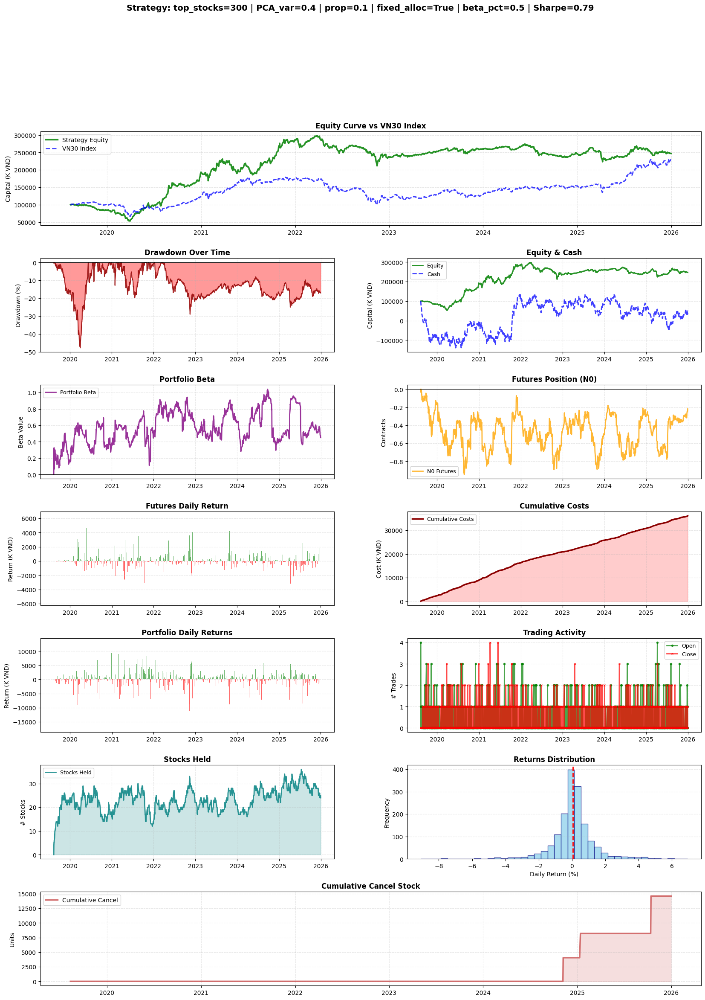

✓
[  2/15] Running: top_stocks=300 | PCA_var=0.40 | prop=0.10 | fixed_alloc=True | beta_pct=0.75... 

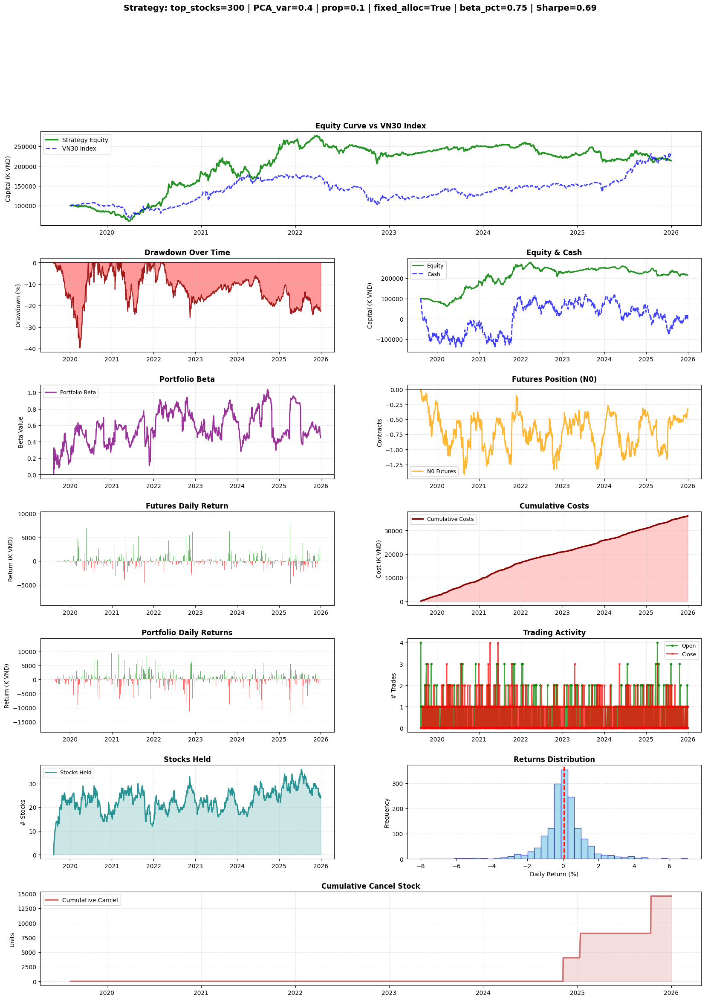

✓
[  3/15] Running: top_stocks=300 | PCA_var=0.40 | prop=0.10 | fixed_alloc=True | beta_pct=1.00... 

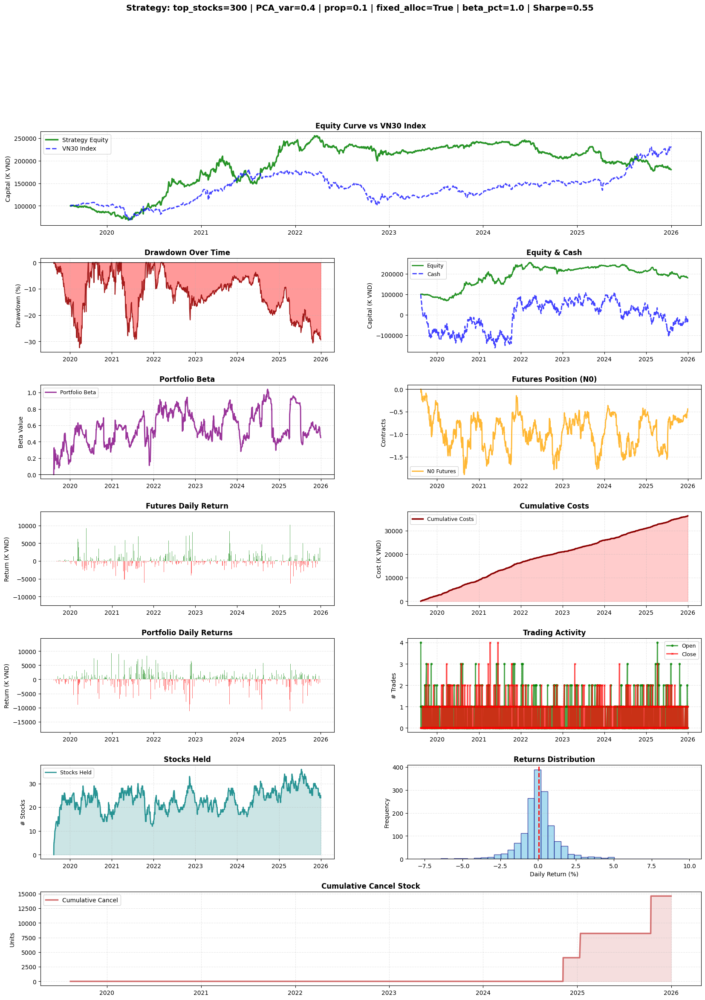

✓
[  4/15] Running: top_stocks=300 | PCA_var=0.50 | prop=0.10 | fixed_alloc=True | beta_pct=0.50... 

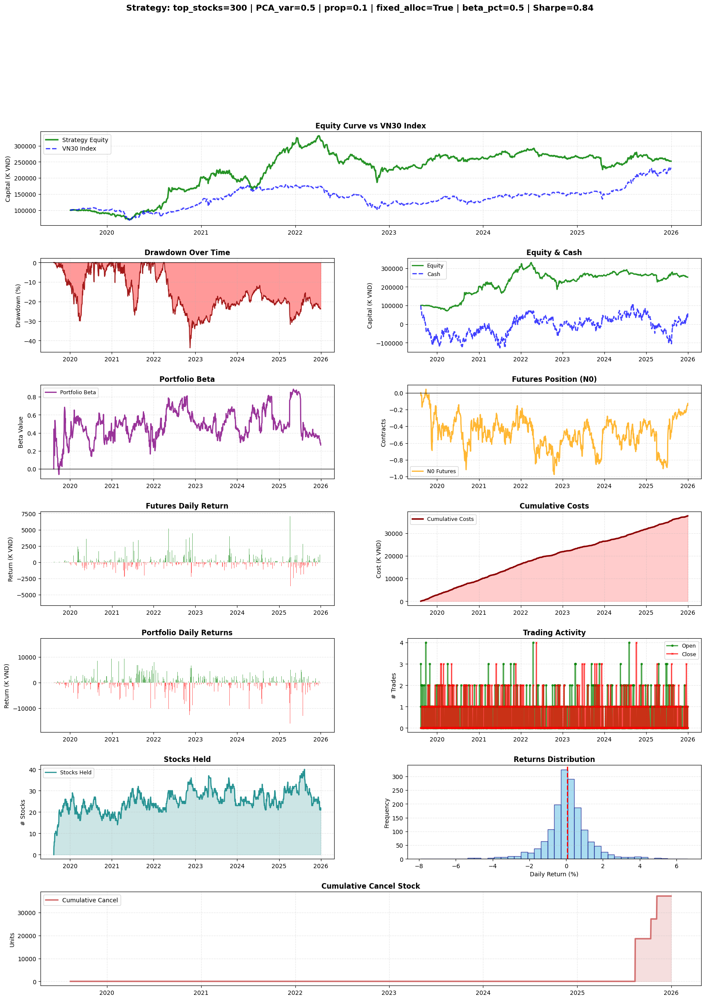

✓
[  5/15] Running: top_stocks=300 | PCA_var=0.50 | prop=0.10 | fixed_alloc=True | beta_pct=0.75... 

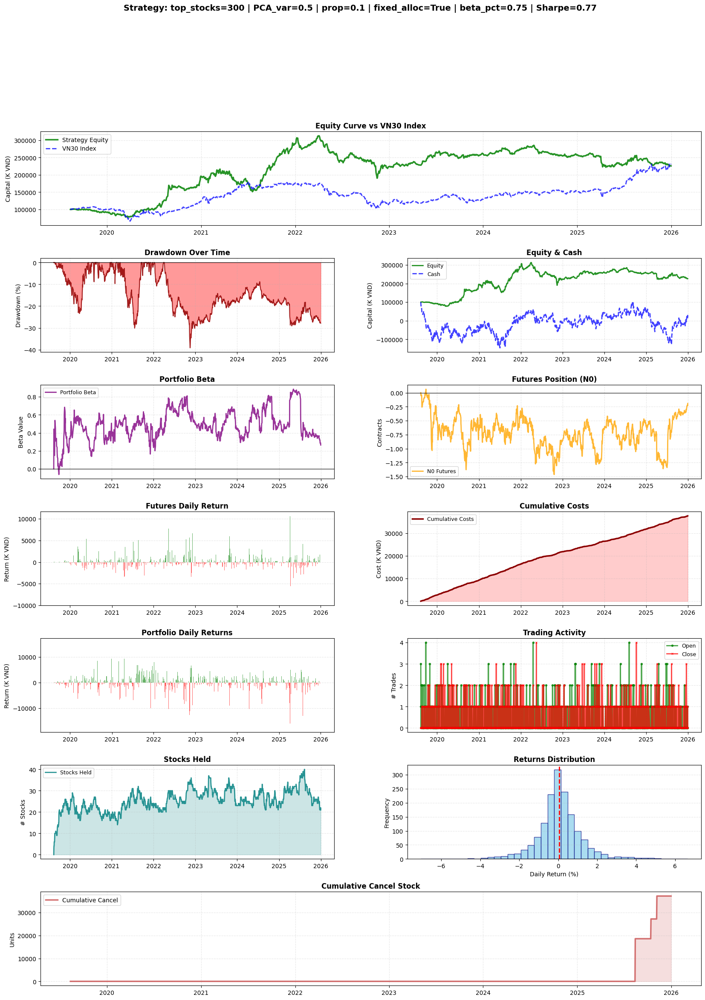

✓
[  6/15] Running: top_stocks=300 | PCA_var=0.50 | prop=0.10 | fixed_alloc=True | beta_pct=1.00... 

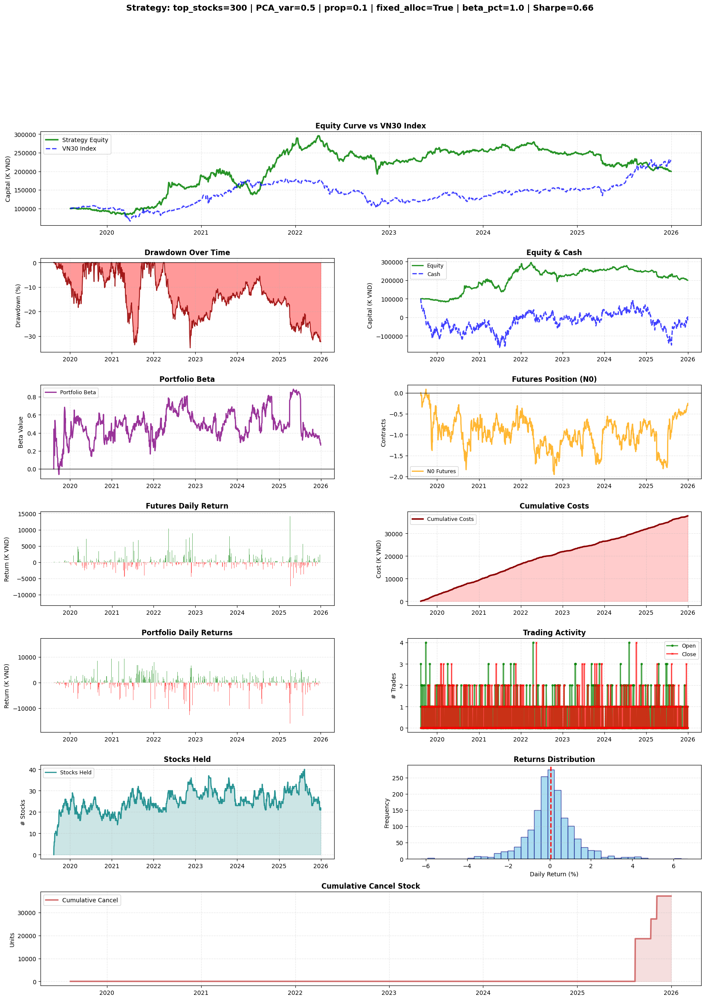

✓
[  7/15] Running: top_stocks=300 | PCA_var=0.60 | prop=0.10 | fixed_alloc=True | beta_pct=0.50... 

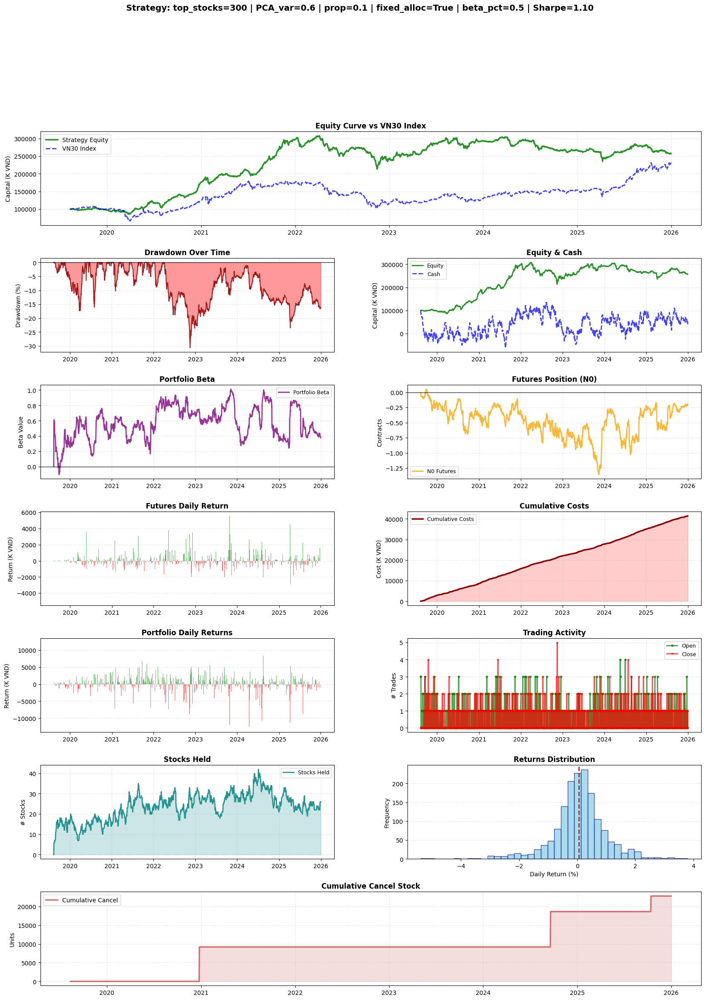

✓
[  8/15] Running: top_stocks=300 | PCA_var=0.60 | prop=0.10 | fixed_alloc=True | beta_pct=0.75... 

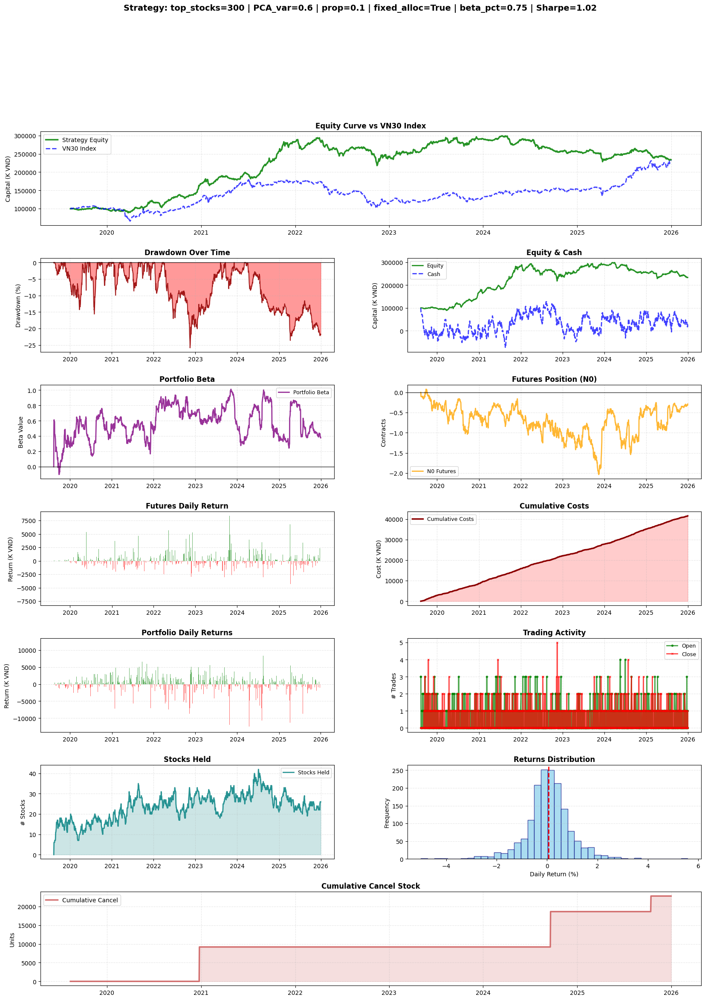

✓
[  9/15] Running: top_stocks=300 | PCA_var=0.60 | prop=0.10 | fixed_alloc=True | beta_pct=1.00... 

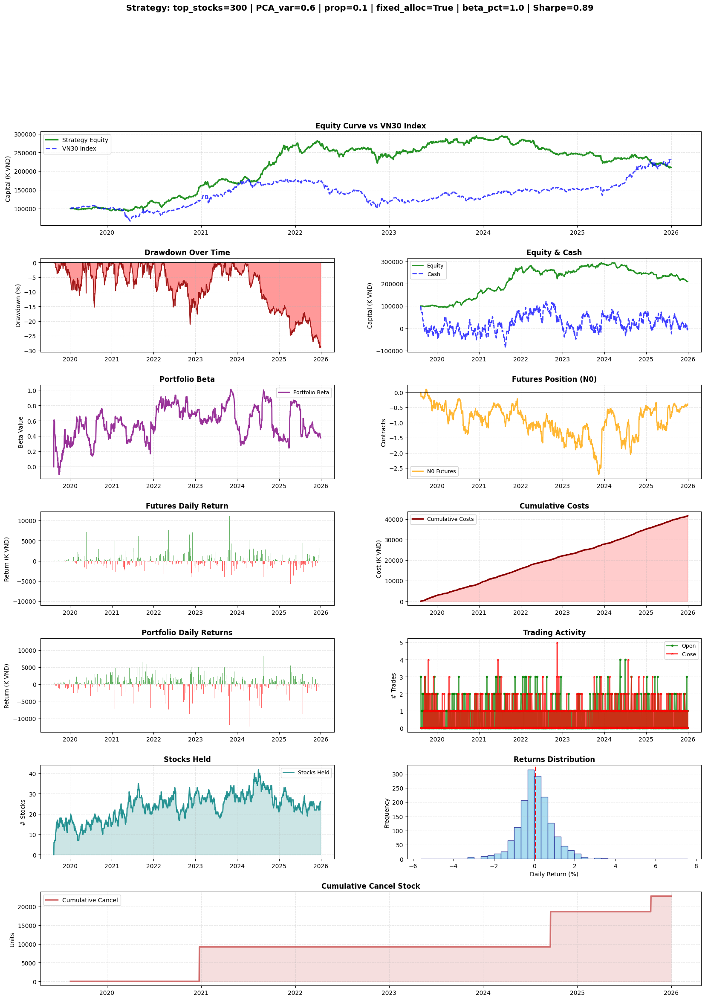

✓
[ 10/15] Running: top_stocks=300 | PCA_var=0.70 | prop=0.10 | fixed_alloc=True | beta_pct=0.50... 

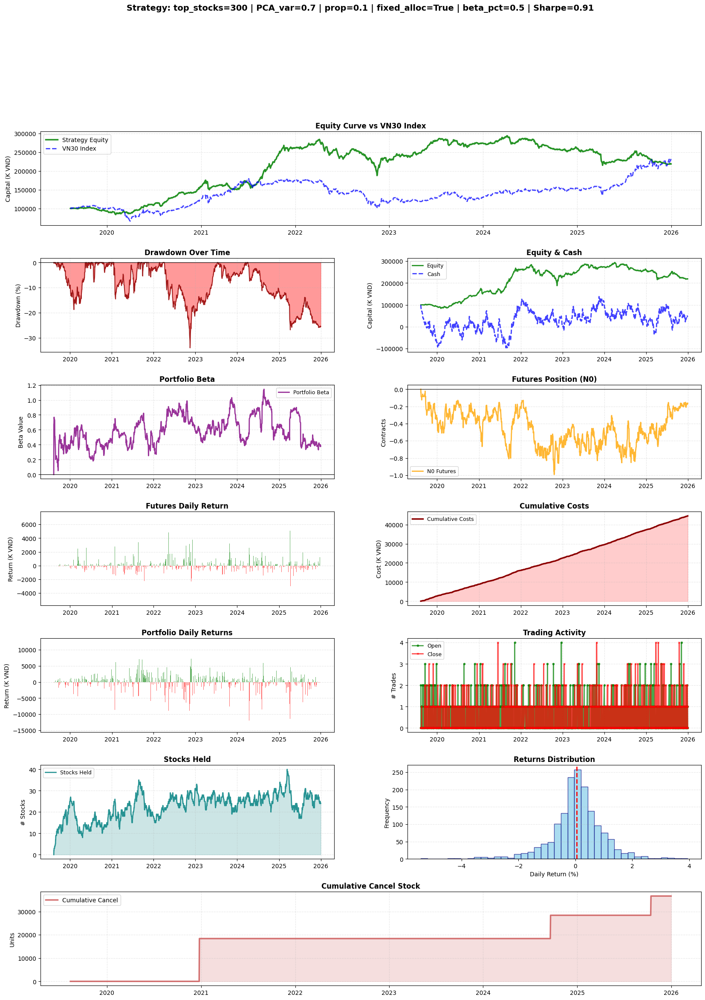

✓
[ 11/15] Running: top_stocks=300 | PCA_var=0.70 | prop=0.10 | fixed_alloc=True | beta_pct=0.75... 

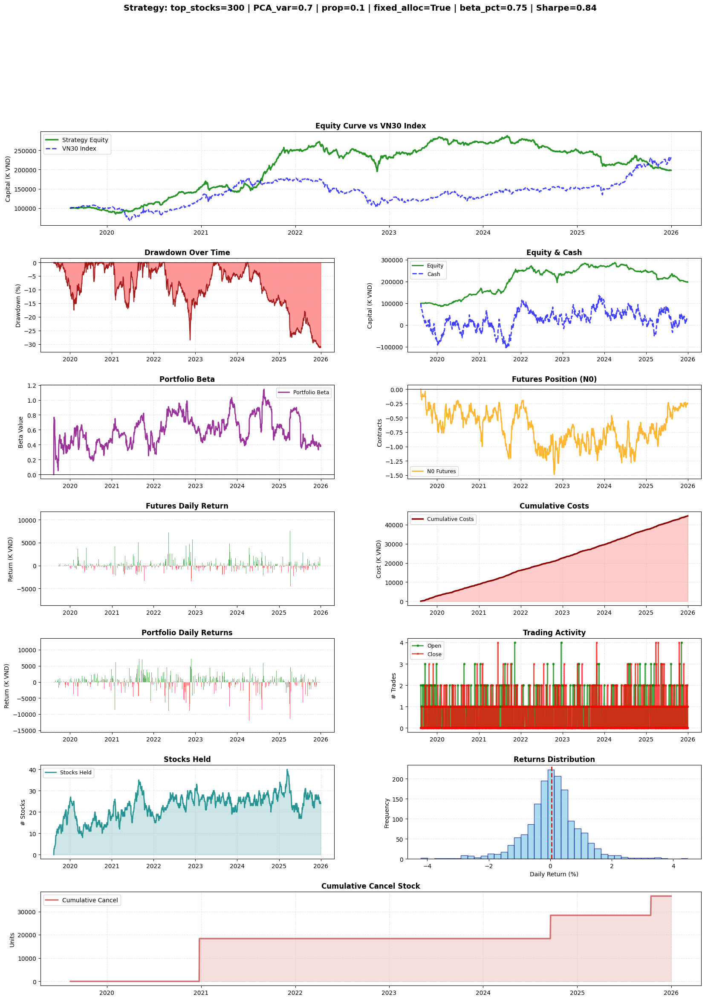

✓
[ 12/15] Running: top_stocks=300 | PCA_var=0.70 | prop=0.10 | fixed_alloc=True | beta_pct=1.00... 

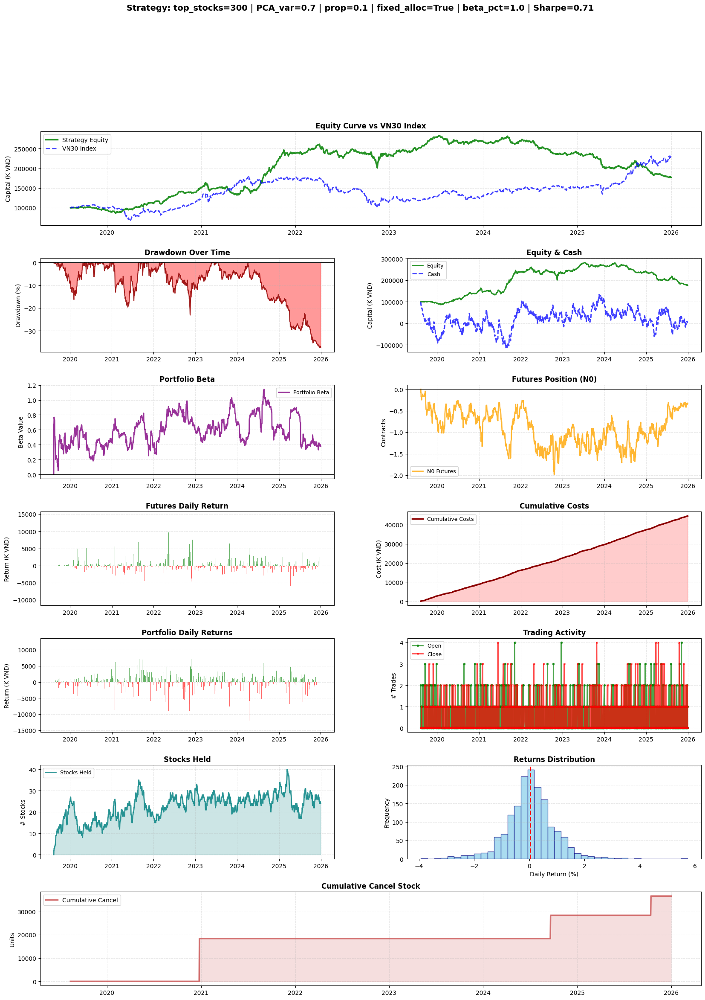

✓
[ 13/15] Running: top_stocks=300 | PCA_var=0.80 | prop=0.10 | fixed_alloc=True | beta_pct=0.50... 

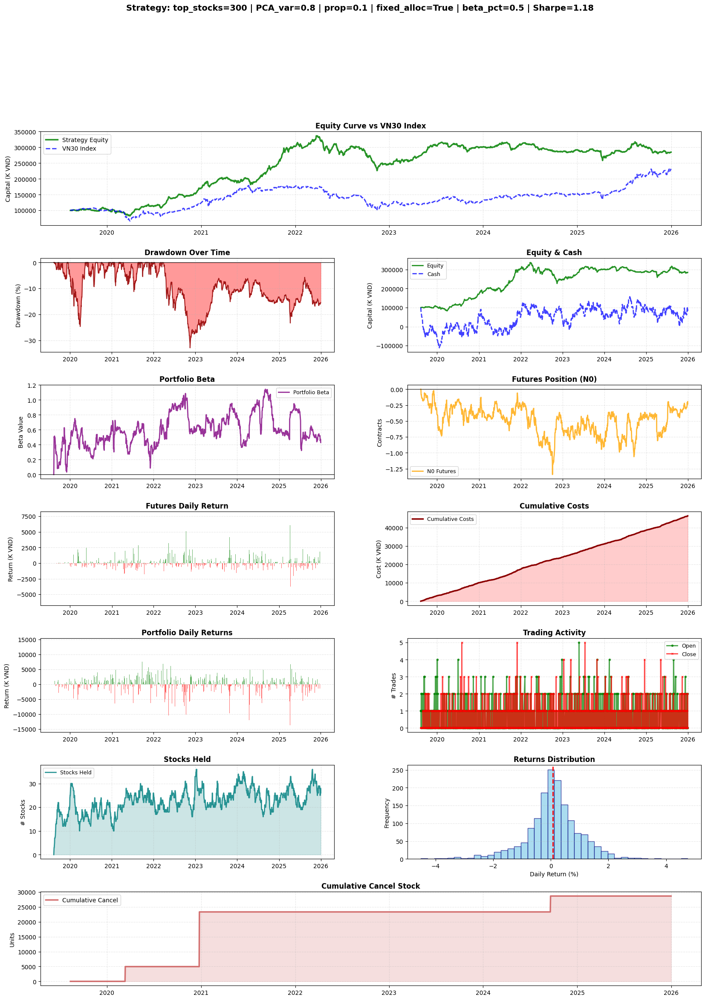

✓
[ 14/15] Running: top_stocks=300 | PCA_var=0.80 | prop=0.10 | fixed_alloc=True | beta_pct=0.75... 

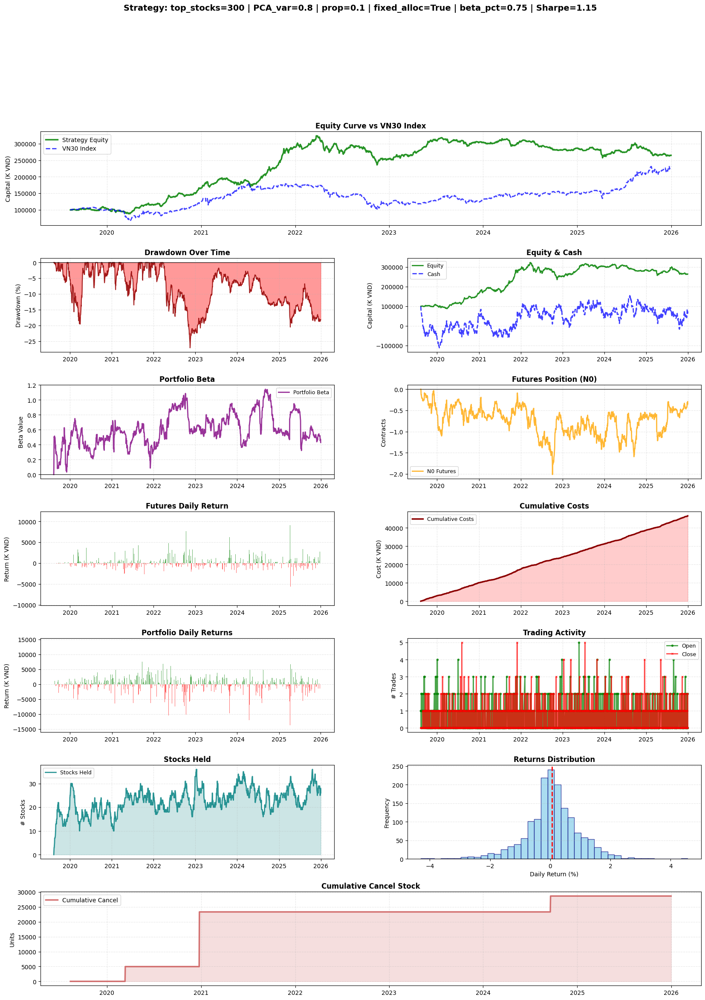

✓
[ 15/15] Running: top_stocks=300 | PCA_var=0.80 | prop=0.10 | fixed_alloc=True | beta_pct=1.00... 

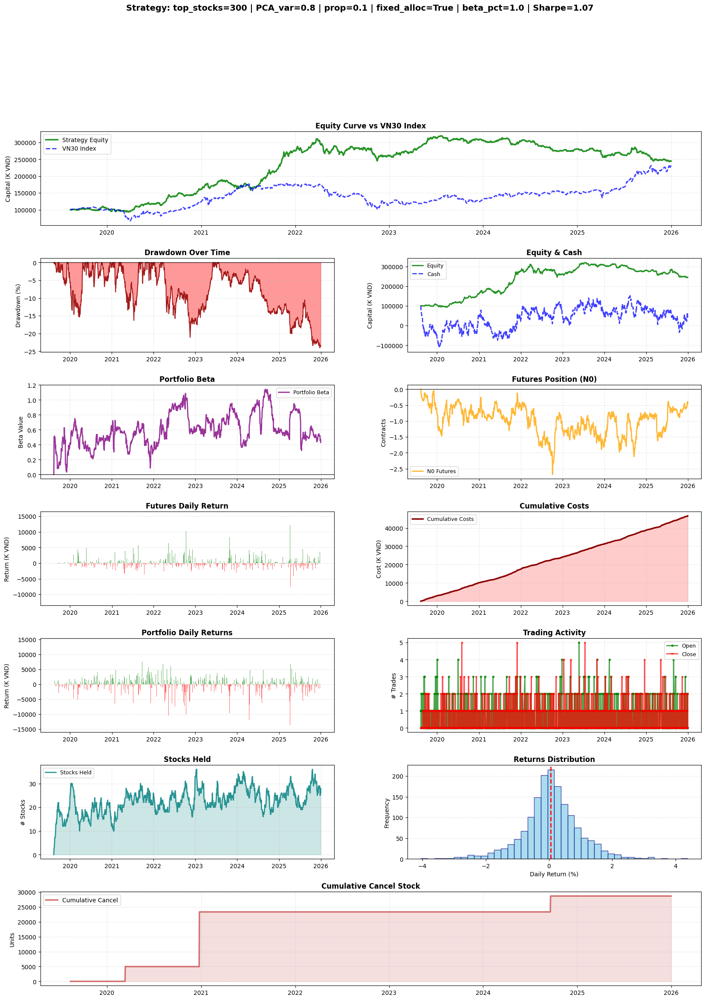

✓

📊 PARAMETER SWEEP RESULTS (Sorted by Sharpe Ratio)
    top_stocks  PCA_variance  proportion  fixed_allocation  beta_percent   Final_Equity  Total_Return_%  Sharpe_Ratio  Max_Drawdown_%  Annual_Volatility_%   Total_Costs    Futures_PnL  Positive_Days  Win_Rate_%
0          300           0.8         0.1              True          0.50  284778.488827      184.778489      1.178603      -32.803295            14.947805  46472.569406  -39884.568084            938   58.661664
1          300           0.8         0.1              True          0.75  264781.903185      164.781903      1.151990      -27.134886            14.200870  46526.871006  -59826.852125            938   58.661664
2          300           0.6         0.1              True          0.50  257764.064463      157.764064      1.097657      -30.641537            14.567459  41475.642216  -47936.526976            926   57.911194
3          300           0.8         0.1              True          1.00  244785.317543      144.78531

In [30]:
# =========================================================================
# 📝 EXAMPLE 2: Parameter Sweep - Test Multiple Scenarios
# =========================================================================
# Chạy parameter sweep để tìm bộ tham số tốt nhất

# ⚠️ LỰA CHỌN 1: SCAN NHANH (12 scenarios)
sweep_results, detailed_results = run_parameter_sweep(
    price_df=prices_df,
    volume_df=volume_df,
    fu_df=fu_df,
    start_date='2019-08-10',
    end_date='2025-12-31',
    # Các tham số để quét
    top_stocks_list=[300],           # 1 values
    PCA_variance_threshold_list=[0.4, 0.5, 0.6, 0.7, 0.8],  # 5 values
    proportion_list=[0.1],                # 1 value
    fixed_allocation_list=[True],  # 1 values (NEW)
    beta_percent_list=[0.5, 0.75, 1.0],         # 3 values
    # Total: 1*4*1*1*3 = 12 scenarios
    initial_capital=100000,
    show_individual_plots=True
)



🚀 STARTING BACKTEST
   Parameters: top_stocks=300, PCA_var=0.7, proportion=0.1, fixed_allocation=True, beta_percent=1

📊 BACKTEST RESULTS
💰 Final Equity:        177,082 K VND
📈 Total Return:        +77.08%
🏆 Sharpe Ratio:        0.708
📉 Max Drawdown:        -37.47%
💸 Total Costs:         44,623 K VND
📊 Futures P&L:         -83,034 K VND
✅ Positive Days:       929
❌ Negative Days:       670


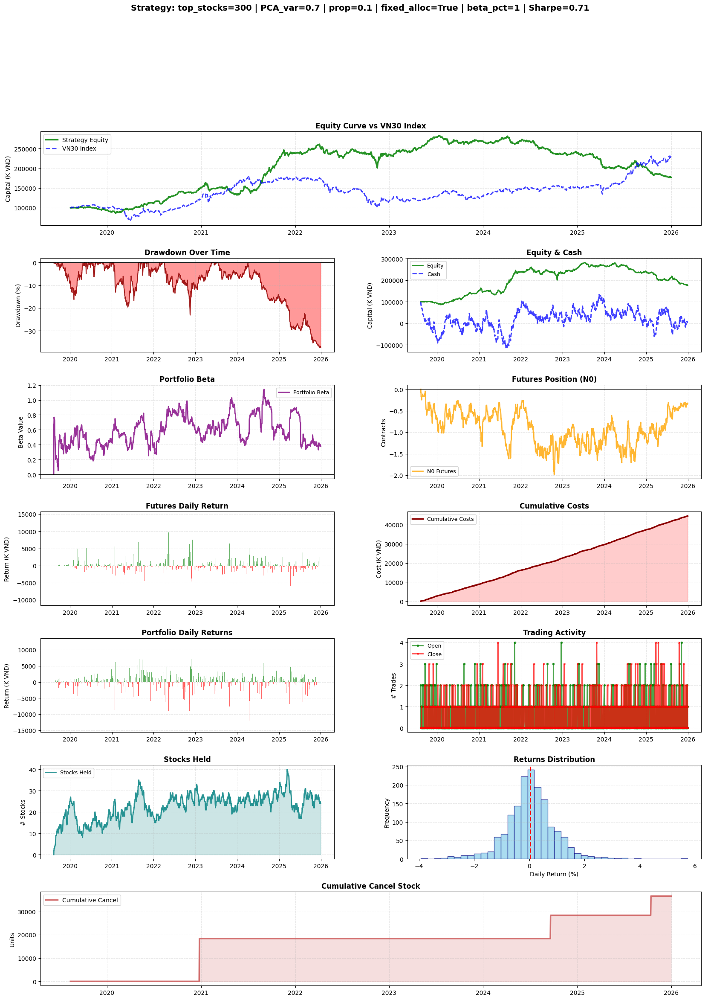

In [22]:
result = run_backtest_and_visualize(
    price_df=prices_df,
    volume_df=volume_df,
    fu_df=fu_df,
    start_date='2019-08-10',
    end_date='2025-12-31',
    top_stocks=300,                    # [200-400] Số cổ phiếu chọn
    PCA_variance_threshold=0.7,        # [0.55-0.9] % variance giải thích
    proportion=0.1,                    # [0.1-0.5] % vốn dùng per trade
    beta_percent=1,
    fixed_allocation= True,
    # [0.3-1.0] % hedge
    initial_capital=100000,
    show_plots=True
)